Downloading Detectron2 was hard and unfortunately I didn't save the specific parameters and code I used to download it (that's also why it's a different notebook, as I used different kernel).

### libraries

In [1]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import detectron2
import os
import json
import cv2
import numpy as np
from PIL import Image
import glob
from matplotlib import pyplot as plt
import random
from detectron2.utils.visualizer import Visualizer
from detectron2 import model_zoo
import pandas as pd
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import ColorMode
from detectron2.data import build_detection_train_loader, DatasetMapper, get_detection_dataset_dicts
from detectron2.data.samplers import RepeatFactorTrainingSampler

In [2]:
PROJECT_DIR = "/ediss_data/ediss4/sarosh/mira/Thesis"

### Converting the YOLO-Seg data to COCO

In [ ]:
def convert_yolo_seg_to_coco(dataset_base_dir, output_dir, class_map):
    """
    Convert existing YOLO-Segmentation split to COCO format.
    
    Args:
        dataset_base_dir: Base directory with YOLO structure
        output_dir: Directory to save COCO JSON files
        class_map: Dictionary mapping class names to IDs
    """
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Define paths based on your structure
    train_images_dir = os.path.join(dataset_base_dir, "images", "train")
    train_labels_dir = os.path.join(dataset_base_dir, "labels", "train")
    val_images_dir = os.path.join(dataset_base_dir, "images", "val")
    val_labels_dir = os.path.join(dataset_base_dir, "labels", "val")
    
    # Verify directories exist
    for dir_path in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir]:
        if not os.path.exists(dir_path):
            raise ValueError(f"Directory does not exist: {dir_path}")
    
    # Convert both splits
    print("Converting training split...")
    yolo_seg_to_coco_single_split(
        images_dir=train_images_dir,
        labels_dir=train_labels_dir,
        output_json_path=os.path.join(output_dir, "coco_train.json"),
        class_map=class_map,
        split_name="train"
    )
    
    print("Converting validation split...")
    yolo_seg_to_coco_single_split(
        images_dir=val_images_dir,
        labels_dir=val_labels_dir,
        output_json_path=os.path.join(output_dir, "coco_val.json"),
        class_map=class_map,
        split_name="val"
    )

def yolo_seg_to_coco_single_split(images_dir, labels_dir, output_json_path, class_map, split_name):
    """
    Convert a single YOLO-Segmentation split to COCO format.
    """
    
    reverse_class_map = {v: k for k, v in class_map.items()}
    
    coco_dataset = {
        "info": {
            "description": f"Converted from YOLO-Seg format - {split_name} split",
            "version": "1.0",
            "year": 2024,
            "contributor": "",
            "date_created": "2024-01-01"
        },
        "licenses": [{"id": 1, "name": "Unknown", "url": ""}],
        "categories": [],
        "images": [],
        "annotations": []
    }
    
    # Add categories
    for class_id, class_name in reverse_class_map.items():
        coco_dataset["categories"].append({
            "id": class_id,
            "name": class_name,
            "supercategory": "none"
        })
    
    # Get all image files
    image_files = glob.glob(os.path.join(images_dir, "*.png"))
    if not image_files:
        image_files = glob.glob(os.path.join(images_dir, "*.jpg"))
        if not image_files:
            image_files = glob.glob(os.path.join(images_dir, "*.jpeg"))
    
    annotation_id = 1
    
    for img_idx, image_path in enumerate(image_files):
        image_name = os.path.basename(image_path)
        # Handle different image extensions
        tile_id = os.path.splitext(image_name)[0]
        label_path = os.path.join(labels_dir, f"{tile_id}.txt")
        
        try:
            with Image.open(image_path) as img:
                width, height = img.size
        except Exception as e:
            print(f"Error reading image {image_path}: {e}")
            continue
        
        image_id = img_idx + 1
        coco_dataset["images"].append({
            "id": image_id,
            "width": width,
            "height": height,
            "file_name": image_name,
            "license": 1,
            "date_captured": "2024-01-01"
        })
        
        if os.path.exists(label_path) and os.path.getsize(label_path) > 0:
            try:
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                
                for line in lines:
                    if line.strip():
                        parts = line.strip().split()
                        if len(parts) < 7:  # Need at least class_id + 3 points
                            continue
                        
                        class_id = int(parts[0])
                        coords = list(map(float, parts[1:]))
                        
                        # Convert normalized coordinates to absolute pixel coordinates
                        pixel_coords = []
                        for i in range(0, len(coords), 2):
                            x = coords[i] * width
                            y = coords[i + 1] * height
                            pixel_coords.append([x, y])
                        
                        points = np.array(pixel_coords, dtype=np.float32)
                        
                        # Create segmentation polygon
                        segmentation = points.flatten().tolist()
                        
                        # Calculate bounding box
                        x_coords = points[:, 0]
                        y_coords = points[:, 1]
                        x_min = max(0, min(x_coords))
                        y_min = max(0, min(y_coords))
                        x_max = min(width, max(x_coords))
                        y_max = min(height, max(y_coords))
                        
                        bbox_width = x_max - x_min
                        bbox_height = y_max - y_min
                        
                        # Calculate area (approximate as polygon area)
                        area = cv2.contourArea(points.astype(np.float32))
                        
                        # Add annotation to COCO dataset
                        coco_dataset["annotations"].append({
                            "id": annotation_id,
                            "image_id": image_id,
                            "category_id": class_id,
                            "segmentation": [segmentation],
                            "area": float(area),
                            "bbox": [float(x_min), float(y_min), float(bbox_width), float(bbox_height)],
                            "iscrowd": 0
                        })
                        
                        annotation_id += 1
                        
            except Exception as e:
                print(f"Error processing label {label_path}: {e}")
                continue
    
    # Save COCO dataset to JSON file
    with open(output_json_path, 'w') as f:
        json.dump(coco_dataset, f, indent=2)
    
    print(f"Converted {len(image_files)} images to COCO format for {split_name}")
    print(f"Total annotations: {annotation_id - 1}")
    print(f"Saved to: {output_json_path}")

# Usage with your existing structure
class_map = {'builds': 0, 'street': 1}

convert_yolo_seg_to_coco(
    dataset_base_dir=PROJECT_DIR + "/yolo_dataset_seg_new",
    output_dir=PROJECT_DIR + "/coco_dataset_new",
    class_map=class_map
)

'def convert_yolo_seg_to_coco(dataset_base_dir, output_dir, class_map):\n    """\n    Convert existing YOLO-Segmentation split to COCO format.\n    \n    Args:\n        dataset_base_dir: Base directory with YOLO structure\n        output_dir: Directory to save COCO JSON files\n        class_map: Dictionary mapping class names to IDs\n    """\n    \n    # Create output directory\n    os.makedirs(output_dir, exist_ok=True)\n    \n    # Define paths based on your structure\n    train_images_dir = os.path.join(dataset_base_dir, "images", "train")\n    train_labels_dir = os.path.join(dataset_base_dir, "labels", "train")\n    val_images_dir = os.path.join(dataset_base_dir, "images", "val")\n    val_labels_dir = os.path.join(dataset_base_dir, "labels", "val")\n    \n    # Verify directories exist\n    for dir_path in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir]:\n        if not os.path.exists(dir_path):\n            raise ValueError(f"Directory does not exist: {dir_pat

In [59]:
import json, copy, math

def fix_coco_ids(in_path, out_path):
    with open(in_path, "r") as f:
        coco = json.load(f)

    # Map old ids -> new contiguous starting at 1
    old_ids = [c["id"] for c in coco["categories"]]
    id_map = {old: i+1 for i, old in enumerate(sorted(old_ids))}

    # Fix categories
    cats = []
    for c in coco["categories"]:
        d = copy.deepcopy(c)
        d["id"] = id_map[c["id"]]
        cats.append(d)
    coco["categories"] = cats

    # Fix annotations
    img_lookup = {im["id"]: (im["width"], im["height"]) for im in coco["images"]}
    new_anns = []
    for a in coco["annotations"]:
        a = copy.deepcopy(a)
        a["category_id"] = id_map[a["category_id"]]

        # Clip XYWH bbox into image bounds
        W, H = img_lookup[a["image_id"]]
        x,y,w,h = a["bbox"]
        x = max(0, min(x, W-1)); y = max(0, min(y, H-1))
        w = max(1, min(w, W - x)); h = max(1, min(h, H - y))
        a["bbox"] = [x,y,w,h]

        # Drop degenerate polygons
        seg = a.get("segmentation", [])
        if isinstance(seg, list):
            seg = [poly for poly in seg if isinstance(poly, list) and len(poly) >= 6]
            if len(seg) == 0:
                continue
            a["segmentation"] = seg

        new_anns.append(a)

    coco["annotations"] = new_anns

    with open(out_path, "w") as f:
        json.dump(coco, f)

    print("Wrote:", out_path)

# Example usage
fix_coco_ids(PROJECT_DIR+"/coco_dataset_new/coco_train.json", PROJECT_DIR+"/coco_dataset_new/coco_train_fixed.json")
fix_coco_ids(PROJECT_DIR+"/coco_dataset_new/coco_val.json", PROJECT_DIR+"/coco_dataset_new/coco_val_fixed.json")


Wrote: /ediss_data/ediss4/sarosh/mira/Thesis/coco_dataset_new/coco_train_fixed.json
Wrote: /ediss_data/ediss4/sarosh/mira/Thesis/coco_dataset_new/coco_val_fixed.json


### Setting everything

In [3]:
CLASSES = ["builds", "street"]
ID_MAP = {1:0, 2:1}  # JSON uses 1/2, Detectron2 expects 0/1 internally

for split in ["train", "val"]:
    meta = MetadataCatalog.get(f"shymkent_{split}")
    meta.set(thing_classes=CLASSES)
    meta.set(thing_dataset_id_to_contiguous_id=ID_MAP)

In [4]:
# 0) Imports
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances

# 1) Names and paths (use your *fixed* COCO files)
DATASET_ROOT = "/ediss_data/ediss4/sarosh/mira/Thesis"
IMG_ROOT     = f"{DATASET_ROOT}/yolo_images_Shymkent"  # folder with images
TRAIN_JSON   = f"{DATASET_ROOT}/coco_dataset_new/coco_train_fixed.json"
VAL_JSON     = f"{DATASET_ROOT}/coco_dataset_new/coco_val_fixed.json"

# 2) (Re)register safely — works even if you rerun the cell
for name, json_file in [
    ("shymkent_train", TRAIN_JSON),
    ("shymkent_val",   VAL_JSON),
]:
    if name in DatasetCatalog.list():
        DatasetCatalog.remove(name)
        MetadataCatalog.remove(name)

    register_coco_instances(name, {}, json_file, IMG_ROOT)

    # Set consistent metadata and id mapping (JSON is 1/2; model is 0/1)
    CLASSES = ["builds", "street"]
    ID_MAP  = {1: 0, 2: 1}
    meta = MetadataCatalog.get(name)
    meta.set(thing_classes=CLASSES,
             thing_dataset_id_to_contiguous_id=ID_MAP)
    # Optional, but nice to have:
    meta.set(evaluator_type="coco")

print("Registered:", DatasetCatalog.list())


Registered: ['coco_2014_train', 'coco_2014_val', 'coco_2014_minival', 'coco_2014_valminusminival', 'coco_2017_train', 'coco_2017_val', 'coco_2017_test', 'coco_2017_test-dev', 'coco_2017_val_100', 'keypoints_coco_2014_train', 'keypoints_coco_2014_val', 'keypoints_coco_2014_minival', 'keypoints_coco_2014_valminusminival', 'keypoints_coco_2017_train', 'keypoints_coco_2017_val', 'keypoints_coco_2017_val_100', 'coco_2017_train_panoptic_separated', 'coco_2017_train_panoptic_stuffonly', 'coco_2017_train_panoptic', 'coco_2017_val_panoptic_separated', 'coco_2017_val_panoptic_stuffonly', 'coco_2017_val_panoptic', 'coco_2017_val_100_panoptic_separated', 'coco_2017_val_100_panoptic_stuffonly', 'coco_2017_val_100_panoptic', 'lvis_v1_train', 'lvis_v1_val', 'lvis_v1_test_dev', 'lvis_v1_test_challenge', 'lvis_v0.5_train', 'lvis_v0.5_val', 'lvis_v0.5_val_rand_100', 'lvis_v0.5_test', 'lvis_v0.5_train_cocofied', 'lvis_v0.5_val_cocofied', 'cityscapes_fine_instance_seg_train', 'cityscapes_fine_sem_seg_trai

### Training

In [5]:
def build_train_loader(cfg):
    dataset_dicts = get_detection_dataset_dicts(cfg.DATASETS.TRAIN)
    repeat_factors = RepeatFactorTrainingSampler.repeat_factors_from_category_frequency(
        dataset_dicts, 
        repeat_thresh=0.001   # lower → stronger oversampling
    )
    return build_detection_train_loader(cfg, sampler=RepeatFactorTrainingSampler(repeat_factors))

In [6]:
class MyTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_train_loader(cfg)

In [7]:
cfg = get_cfg()
cfg.OUTPUT_DIR = PROJECT_DIR + "/output_detectron2_30000_check"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("shymkent_train",)
cfg.DATASETS.TEST = ("shymkent_val",)
cfg.DATALOADER.NUM_WORKERS = 0
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2 # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 2.5e-3
cfg.SOLVER.MAX_ITER = 30000
cfg.SOLVER.STEPS = (28000, 29000)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
cfg.TEST.EVAL_PERIOD = 1000

# Adjust for your image size if needed
cfg.INPUT.MIN_SIZE_TRAIN = (1280,)
cfg.INPUT.MAX_SIZE_TRAIN = 1280
cfg.INPUT.MIN_SIZE_TEST = 1280
cfg.INPUT.MAX_SIZE_TEST = 1280

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
cfg.MODEL.DEVICE = "cuda"
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)

[09/12 16:58:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (2, 256, 1, 1) in

In [66]:
trainer.train()

[09/09 16:13:37 d2.engine.train_loop]: Starting training from iteration 0
[09/09 16:13:47 d2.utils.events]:  eta: 3:45:42  iter: 19  total_loss: 2.347  loss_cls: 1.043  loss_box_reg: 0.2657  loss_mask: 0.6882  loss_rpn_cls: 0.2045  loss_rpn_loc: 0.1282    time: 0.4544  last_time: 0.4515  data_time: 0.1625  last_data_time: 0.1587   lr: 4.9952e-05  max_mem: 4201M
[09/09 16:13:56 d2.utils.events]:  eta: 3:46:39  iter: 39  total_loss: 1.83  loss_cls: 0.496  loss_box_reg: 0.2779  loss_mask: 0.6446  loss_rpn_cls: 0.2131  loss_rpn_loc: 0.1022    time: 0.4574  last_time: 0.4643  data_time: 0.1638  last_data_time: 0.1636   lr: 9.9902e-05  max_mem: 4201M
[09/09 16:14:05 d2.utils.events]:  eta: 3:46:11  iter: 59  total_loss: 1.608  loss_cls: 0.3394  loss_box_reg: 0.3677  loss_mask: 0.591  loss_rpn_cls: 0.1028  loss_rpn_loc: 0.1093    time: 0.4561  last_time: 0.4299  data_time: 0.1595  last_data_time: 0.1481   lr: 0.00014985  max_mem: 4201M
[09/09 16:14:14 d2.utils.events]:  eta: 3:45:52  iter: 79

KeyboardInterrupt: 

### Validation & Inference

Saving the config file

Validation

In [68]:
from detectron2.evaluation import DatasetEvaluators
evaluator = DatasetEvaluators([
    COCOEvaluator("shymkent_val", cfg, False, output_dir="./output_detectron2_30000_check/")
])
cfg.MODEL.WEIGHTS="../input/detectron2cell/output_detexron2_30000/model_0024999.pth"
val_loader = build_detection_test_loader(cfg, "shymkent_val")
metrics = inference_on_dataset(trainer.model, val_loader, evaluator)
print(metrics)

WARNING [09/09 19:31:50 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[09/09 19:31:50 d2.data.datasets.coco]: Loaded 461 images in COCO format from /ediss_data/ediss4/sarosh/mira/Thesis/coco_dataset_new/coco_val_fixed.json
[09/09 19:31:50 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1280, 1280), max_size=1280, sample_style='choice')]
[09/09 19:31:50 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/09 19:31:50 d2.data.common]: Serializing 461 elements to byte tensors and concatenating them all ...
[09/09 19:31:50 d2.data.common]: Serialized dataset takes 0.99 MiB
[09/09 19:31:50 d2.evaluation.evaluator]: Start inference on 461 batches
[09/09 19:31:52 d2.evaluation.evaluator]: Inference done 11/461. Dataloading: 0.0605 s/iter. Inference: 0.0635 s/iter. Eval: 0.0363 s

In [54]:
cfg.INPUT.MASK_FORMAT = "polygon"

In [69]:
def quick_metrics_analysis(metrics_path):
    """Quick analysis of training metrics"""
    
    with open(metrics_path, 'r') as f:
        metrics = [json.loads(line) for line in f]
    
    df = pd.DataFrame(metrics)
    
    print("Available metrics columns:")
    print(df.columns.tolist())
    print(f"\nTotal iterations: {len(df)}")
    
    # Show final values
    print("\nFinal values:")
    final_row = df.iloc[-1]
    for col in df.columns:
        if pd.notna(final_row[col]):
            print(f"{col}: {final_row[col]:.4f}")
    
    # Show best values for key metrics
    key_metrics = ['total_loss', 'loss_cls', 'loss_box_reg', 'loss_mask', 'lr']
    print("\nBest values achieved:")
    for metric in key_metrics:
        if metric in df.columns:
            best_val = df[metric].min() if 'loss' in metric else df[metric].max()
            print(f"{metric}: {best_val:.4f}")

# Quick analysis
quick_metrics_analysis(PROJECT_DIR + "/output_detectron2_30000_check/metrics.json")

Available metrics columns:
['data_time', 'eta_seconds', 'fast_rcnn/cls_accuracy', 'fast_rcnn/false_negative', 'fast_rcnn/fg_cls_accuracy', 'iteration', 'loss_box_reg', 'loss_cls', 'loss_mask', 'loss_rpn_cls', 'loss_rpn_loc', 'lr', 'mask_rcnn/accuracy', 'mask_rcnn/false_negative', 'mask_rcnn/false_positive', 'rank_data_time', 'roi_head/num_bg_samples', 'roi_head/num_fg_samples', 'rpn/num_neg_anchors', 'rpn/num_pos_anchors', 'time', 'total_loss']

Total iterations: 1268

Final values:
eta_seconds: 2172.9485
iteration: 25327.0000

Best values achieved:
total_loss: 0.2220
loss_cls: 0.0253
loss_box_reg: 0.0743
loss_mask: 0.0773
lr: 0.0025


In [8]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0024999.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("shymkent_val", )
predictor = DefaultPredictor(cfg)

[09/12 16:58:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /ediss_data/ediss4/sarosh/mira/Thesis/output_detectron2_30000_check/model_0024999.pth ...


/ediss_data/ediss4/sarosh/anaconda3/envs/detectron2_hope/lib/python3.8/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return to

In [22]:
import random, cv2, torch, numpy as np
from detectron2.data import DatasetCatalog
from pycocotools import mask as mask_utils

def gt_bitmasks_from_anns(anns, H, W):
    ms = []
    for a in anns:
        seg = a.get("segmentation", None)
        if not seg: 
            continue
        if isinstance(seg, list):             # polygons
            rles = mask_utils.frPyObjects(seg, H, W)
            rle  = mask_utils.merge(rles)
            m = mask_utils.decode(rle)        # (H,W) or (H,W,N)
            if m.ndim == 3: m = np.any(m, axis=2)
        elif isinstance(seg, dict):           # RLE
            m = mask_utils.decode(seg)
            if m.ndim == 3: m = m[:, :, 0]
        else:
            continue
        ms.append(torch.as_tensor(m, dtype=torch.bool))
    if len(ms) == 0:
        return torch.zeros((0, H, W), dtype=torch.bool)
    return torch.stack(ms, dim=0)             # (M,H,W)

# ---- pick a random val image and run predictor
d = random.choice(DatasetCatalog.get("shymkent_val"))
img = cv2.imread(d["file_name"])
H, W = img.shape[:2]
pred = predictor(img)["instances"].to("cpu")

gt_bit   = gt_bitmasks_from_anns(d["annotations"], H, W)  # (M,H,W)
pred_bit = pred.pred_masks.bool() if pred.has("pred_masks") else torch.zeros((0,H,W), dtype=torch.bool)

# ---- pairwise IoU (N,M)
if pred_bit.numel() == 0 or gt_bit.numel() == 0:
    print("No preds or no GT masks:", pred_bit.shape[0], gt_bit.shape[0])
else:
    inter = (pred_bit[:, None] & gt_bit[None, :]).float().sum(dim=(2,3))
    union = (pred_bit[:, None] | gt_bit[None, :]).float().sum(dim=(2,3))
    iou = inter / (union + 1e-6)
    print("Num preds / GT:", pred_bit.shape[0], "/", gt_bit.shape[0])
    print("Max IoU per pred:", np.round(iou.max(dim=1).values.numpy(), 3))


[09/09 21:46:04 d2.data.datasets.coco]: Loaded 461 images in COCO format from /ediss_data/ediss4/sarosh/mira/Thesis/coco_dataset_new/coco_val_fixed.json


Num preds / GT: 11 / 14
Max IoU per pred: [0.871 0.931 0.963 0.747 0.947 0.943 0.818 0.901 0.256 0.875 0.824]


In [76]:
res = inference_on_dataset(predictor.model, val_loader, evaluator)
print(res)

[09/09 19:45:04 d2.evaluation.evaluator]: Start inference on 461 batches
[09/09 19:45:06 d2.evaluation.evaluator]: Inference done 11/461. Dataloading: 0.0611 s/iter. Inference: 0.0614 s/iter. Eval: 0.0315 s/iter. Total: 0.1540 s/iter. ETA=0:01:09
[09/09 19:45:11 d2.evaluation.evaluator]: Inference done 44/461. Dataloading: 0.0694 s/iter. Inference: 0.0608 s/iter. Eval: 0.0227 s/iter. Total: 0.1530 s/iter. ETA=0:01:03
[09/09 19:45:16 d2.evaluation.evaluator]: Inference done 79/461. Dataloading: 0.0699 s/iter. Inference: 0.0606 s/iter. Eval: 0.0188 s/iter. Total: 0.1494 s/iter. ETA=0:00:57
[09/09 19:45:21 d2.evaluation.evaluator]: Inference done 113/461. Dataloading: 0.0703 s/iter. Inference: 0.0606 s/iter. Eval: 0.0176 s/iter. Total: 0.1486 s/iter. ETA=0:00:51
[09/09 19:45:26 d2.evaluation.evaluator]: Inference done 145/461. Dataloading: 0.0707 s/iter. Inference: 0.0606 s/iter. Eval: 0.0191 s/iter. Total: 0.1505 s/iter. ETA=0:00:47
[09/09 19:45:31 d2.evaluation.evaluator]: Inference don

### Plotting all masks

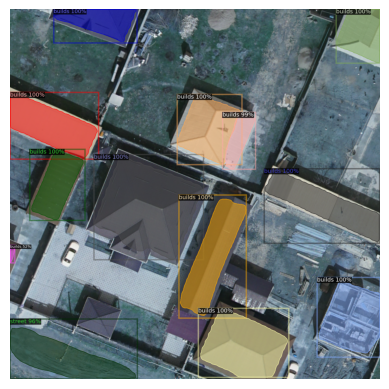

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# 1. Read image
new_im = cv2.imread(r"/ediss_data/ediss4/sarosh/mira/Thesis/yolo_images_Shymkent/Shymkent_5cm_13_34_tile_7_12.png")

# 2. Run predictor (make sure `predictor` is already defined with your trained model)
outputs = predictor(new_im)

# 3. Get metadata from the registered dataset (pick train/val — they have same classes)
metadata = MetadataCatalog.get("shymkent_train")

# 4. Visualize predictions
v = Visualizer(new_im[:, :, ::-1], metadata=metadata, scale=1.0)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

pred_img = out.get_image()[:, :, ::-1]  # back to BGR for cv2
cv2.imwrite("predictions.png", pred_img)

# 5. Plot with matplotlib
plt.imshow(out.get_image()[:, :, ::-1])  # RGB for matplotlib
plt.axis("off")
plt.show()

# 6. Extract predicted masks (if segmentation model)
masks = outputs["instances"].pred_masks.cpu().numpy()
np.save("all_masks.npy", masks)


In [11]:
def process_detectron2_mask(mask_input, target_size=None):
    """
    Process Detectron2 predicted masks (N, H, W) into a single 2D binary mask (0/255).
    """
    mask = None

    # If input is a numpy array (N, H, W)
    if isinstance(mask_input, np.ndarray):
        mask = mask_input
    elif os.path.exists(mask_input):
        # Try reading as .npy first
        try:
            mask = np.load(mask_input)
        except Exception:
            # fallback: read as image
            mask = cv2.imread(mask_input, cv2.IMREAD_GRAYSCALE)

    if mask is None:
        if target_size:
            return np.zeros(target_size, dtype=np.uint8)
        else:
            return np.zeros((640, 640), dtype=np.uint8)

    # Merge 3D masks along first axis: any foreground in any instance becomes foreground
    if mask.ndim == 3:
        mask = np.any(mask > 0, axis=0).astype(np.uint8) * 255
    else:
        mask = (mask > 0).astype(np.uint8) * 255

    # Resize to target size if needed
    if target_size and mask.shape[:2] != target_size:
        mask = cv2.resize(mask, (target_size[1], target_size[0]), interpolation=cv2.INTER_NEAREST)

    return mask


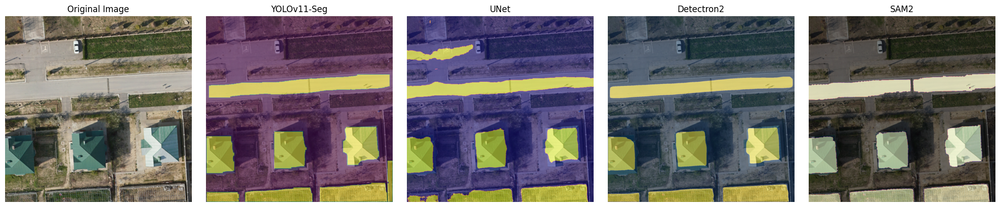

In [24]:
def plot_segmentation_comparison(original_image_path, yolo_txt_path, unet_mask_path, 
                                detectron2_mask_path, sam2_mask_path):
    """
    Plot original image and 4 segmentation masks in one row for thesis comparison.
    """
    
    # Load original image
    original_img = cv2.imread(original_image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    original_height, original_width = original_img.shape[:2]
    
    # Create figure with subplots
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    
    # Plot original image
    axes[0].imshow(original_img)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    # Process and plot YOLOv11-Seg mask
    yolo_mask = process_yolo_mask(yolo_txt_path, original_width, original_height)
    axes[1].imshow(original_img)
    axes[1].imshow(yolo_mask, alpha=0.5, cmap='viridis')
    axes[1].set_title('YOLOv11-Seg')
    axes[1].axis('off')
    
    # Process and plot UNet mask (handle 3 classes with class 2 as background)
    unet_mask = process_unet_mask(unet_mask_path, target_size=(original_height, original_width))
    axes[2].imshow(original_img)
    axes[2].imshow(unet_mask, alpha=0.5, cmap='plasma')
    axes[2].set_title('UNet')
    axes[2].axis('off')
    
    # Process and plot SAM2 mask
    sam2_mask = process_mask(sam2_mask_path, target_size=(original_height, original_width))
    axes[4].imshow(original_img)
    axes[4].imshow(sam2_mask, alpha=0.5, cmap='magma')
    axes[4].set_title('SAM2')
    axes[4].axis('off')

    # Process and plot Detectron2 mask
    detectron2_mask = process_detectron2_mask(detectron2_mask_path, target_size=(original_height, original_width))
    axes[3].imshow(original_img)
    axes[3].imshow(detectron2_mask, alpha=0.5, cmap='cividis')
    axes[3].set_title('Detectron2')
    axes[3].axis('off')
    
    # Adjust layout and save if output path provided
    plt.tight_layout()
    
    plt.show()

def process_yolo_mask(txt_path, img_width, img_height):
    """
    Process YOLO txt annotations into a segmentation mask.
    """
    mask = np.zeros((img_height, img_width), dtype=np.uint8)
    
    if not os.path.exists(txt_path):
        return mask
    
    try:
        with open(txt_path, 'r') as f:
            lines = f.readlines()
        
        for line in lines:
            parts = line.strip().split()
            if len(parts) < 9:  # YOLO segmentation format: class_id x1 y1 x2 y2 ... xn yn
                continue
            
            # Convert normalized coordinates to pixel coordinates
            polygon_points = []
            for i in range(1, len(parts), 2):
                if i + 1 < len(parts):
                    x = float(parts[i]) * img_width
                    y = float(parts[i + 1]) * img_height
                    polygon_points.append([x, y])
            
            if polygon_points:
                # Convert to numpy array and create polygon
                polygon = np.array(polygon_points, dtype=np.int32)
                cv2.fillPoly(mask, [polygon], 255)
                
    except Exception as e:
        print(f"Error processing YOLO mask {txt_path}: {e}")
    
    return mask

def process_unet_mask(mask_path, target_size=None):
    """
    Process UNet segmentation mask with 3 classes (class 2 is background).
    """
    if not os.path.exists(mask_path):
        if target_size:
            return np.zeros(target_size, dtype=np.uint8)
        else:
            return np.zeros((640, 640), dtype=np.uint8)
    
    try:
        # Try to load as image first
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            # Try loading as numpy array
            mask = np.load(mask_path)
            if len(mask.shape) > 2:
                mask = mask.squeeze()
        
        # For UNet, class 2 is background, so we only want classes 0 and 1
        # Create a mask where any non-background class (0 or 1) is foreground
        mask = ((mask == 0) | (mask == 1)).astype(np.uint8) * 255
        
        # Resize if target size is provided and different from current size
        if target_size and mask.shape[:2] != target_size:
            mask = cv2.resize(mask, (target_size[1], target_size[0]), 
                             interpolation=cv2.INTER_NEAREST)
        
        return mask
        
    except Exception as e:
        print(f"Error processing UNet mask {mask_path}: {e}")
        if target_size:
            return np.zeros(target_size, dtype=np.uint8)
        else:
            return np.zeros((640, 640), dtype=np.uint8)

def process_mask(mask_path, target_size=None):
    """
    Process segmentation mask from various formats.
    """
    if not os.path.exists(mask_path):
        if target_size:
            return np.zeros(target_size, dtype=np.uint8)
        else:
            return np.zeros((640, 640), dtype=np.uint8)
    
    try:
        # Try to load as image first
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            # Try loading as numpy array
            mask = np.load(mask_path)
            if len(mask.shape) > 2:
                mask = mask.squeeze()
        
        # Ensure binary mask (0 and 255)
        mask = (mask > 0).astype(np.uint8) * 255
        
        # Resize if target size is provided and different from current size
        if target_size and mask.shape[:2] != target_size:
            mask = cv2.resize(mask, (target_size[1], target_size[0]), 
                             interpolation=cv2.INTER_NEAREST)
        
        return mask
        
    except Exception as e:
        print(f"Error processing mask {mask_path}: {e}")
        if target_size:
            return np.zeros(target_size, dtype=np.uint8)
        else:
            return np.zeros((640, 640), dtype=np.uint8)
detectron2_masks = outputs["instances"].pred_masks.cpu().numpy()
# Example usage
if __name__ == "__main__":
    # Method 1: Direct function call
    plot_segmentation_comparison(
        original_image_path=r"/ediss_data/ediss4/sarosh/mira/Thesis/yolo_images_Shymkent/Shymkent_5cm_10_26_tile_11_12.png",
        yolo_txt_path=r"/ediss_data/ediss4/sarosh/mira/Thesis/runs/segment/predict6/labels/Shymkent_5cm_10_26_tile_11_12.txt",
        unet_mask_path=r"/ediss_data/ediss4/sarosh/mira/Thesis//training_20_pretrained_cosine_check/val_predictions_epoch_20/val_0_7_pred.png",
        detectron2_mask_path=detectron2_masks,
        sam2_mask_path=PROJECT_DIR + "/segment-anything-2/predicted_labels_single/Shymkent_5cm_10_26_tile_11_12_pred.png"
    )

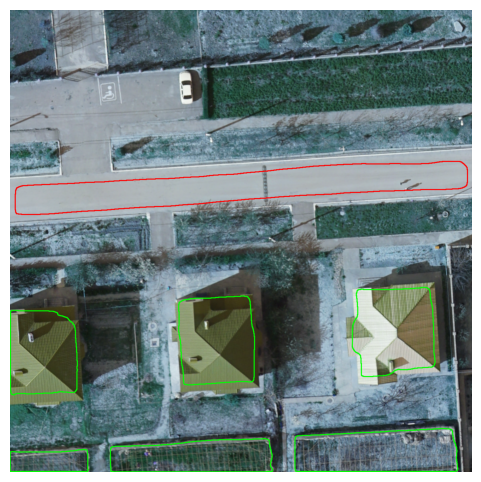

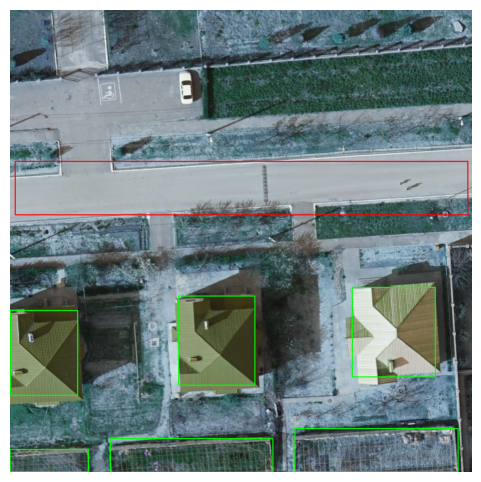

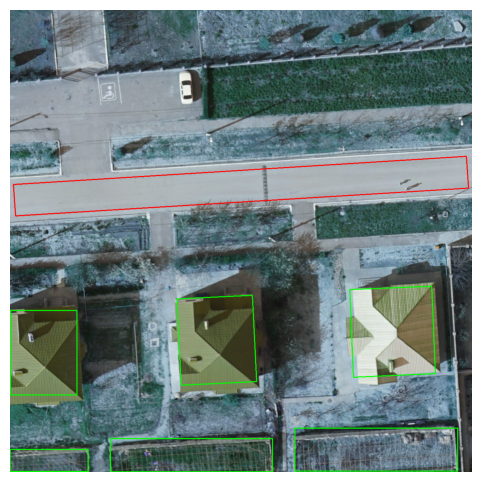

In [26]:
# get predictions
inst = outputs["instances"].to("cpu")
pred_masks   = inst.pred_masks.numpy().astype(np.uint8)   # (N,H,W)
pred_classes = inst.pred_classes.numpy()                  # (N,)

# build multi-class mask (bg 0, builds 1, street 2)
multi_mask = detectron2_to_multiclass(pred_masks, pred_classes)

# colors for classes 1..K (NOT including background 0)
class_colors = {1: (0,255,0),   # builds
                2: (255,0,0)}   # street

new_im = np.array(Image.open(r"/ediss_data/ediss4/sarosh/mira/Thesis/yolo_images_Shymkent/Shymkent_5cm_10_26_tile_11_12.png").convert("RGB"))
# visualize
img_rgb = cv2.cvtColor(new_im, cv2.COLOR_BGR2RGB)
visualize_multiclass_outputs(img_rgb, multi_mask, class_colors, show_polygons=True, save_path=PROJECT_DIR + "/polygon_detectron24")
visualize_multiclass_outputs(img_rgb, multi_mask, class_colors, show_polygons=False, show_aabb=True)
visualize_multiclass_outputs(img_rgb, multi_mask, class_colors, show_polygons=False, show_rotated=True, save_path=PROJECT_DIR + "/rotated_detectron24")



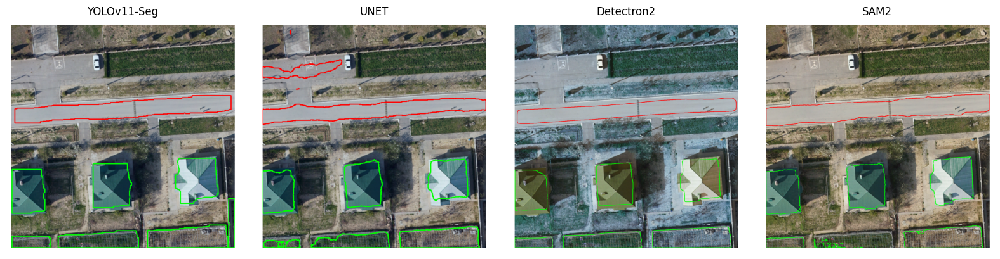

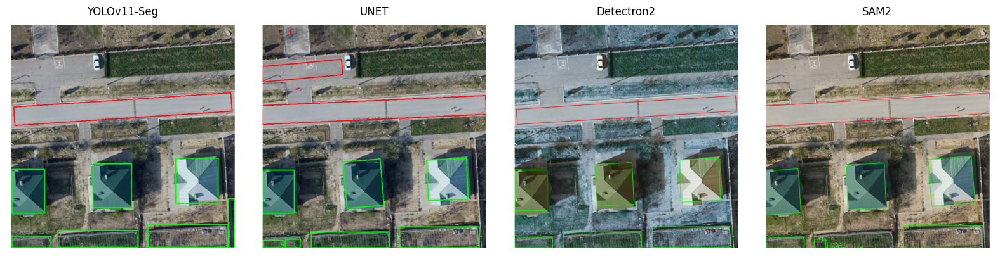

In [27]:
from pathlib import Path

def _imshow_row(image_paths, titles, figsize=(16,4), suptitle=None, save_path=None, dpi=200):
    imgs = []
    for p in image_paths:
        if p and Path(p).exists():
            imgs.append(plt.imread(p))
        else:
            # Placeholder blank if missing
            imgs.append(np.ones((10,10,3), dtype=np.float32))
    n = len(imgs)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for ax, im, t in zip(axes, imgs, titles):
        ax.imshow(im); ax.axis("off"); ax.set_title(t)
    if suptitle:
        fig.suptitle(suptitle, y=1.02, fontsize=12)
    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")
    plt.show()
    plt.close(fig)

def plot_saved_comparisons(
    polygons_files, rotated_files,
    titles=("YOLOv11-Seg","UNET","Detectron2", "SAM2"),
    save_out_polygons_row=None, save_out_rotated_row=None, dpi=200
):
    """
    polygons_files: list of 4 paths [yolo, unet, sam2, detectron2]
    rotated_files:  list of 4 paths [yolo, unet, sam2, detectron2]
    """
    _imshow_row(polygons_files, titles, figsize=(16,4),
                suptitle=None, save_path=save_out_polygons_row, dpi=dpi)
    _imshow_row(rotated_files, titles, figsize=(16,4),
                suptitle=None, save_path=save_out_rotated_row, dpi=dpi)
# Now assemble the saved images into two rows and (optionally) save them
plot_saved_comparisons(
    polygons_files=[PROJECT_DIR+"/polygon_YOLO4.png",PROJECT_DIR+"/polygon_UNET4.png",PROJECT_DIR+"/polygon_detectron24.png",PROJECT_DIR+"/polygon_SAM24.png"],
    rotated_files =[PROJECT_DIR+"/rotated_YOLO4.png",PROJECT_DIR+"/rotated_UNET4.png",PROJECT_DIR+"/rotated_detectron24.png",PROJECT_DIR+"/rotated_SAM24.png"],
    titles=("YOLOv11-Seg","UNET", "Detectron2","SAM2"),
    save_out_polygons_row=None,
    save_out_rotated_row=None,
    dpi=200
)

In [18]:
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def _fit_to_canvas(path, target_hw=(720, 720), bg=1.0):
    """
    Load image at `path`, resize to fit inside target canvas while preserving aspect,
    then letterbox-pad to exactly target_hw (H, W). Returns float RGB [0..1].
    """
    Ht, Wt = target_hw
    if not Path(path).exists():
        # blank canvas if missing
        arr = np.ones((Ht, Wt, 3), dtype=np.float32) * float(bg)
        return arr

    im = Image.open(path)
    # Convert to RGB (handles L, LA, RGBA, etc.)
    if im.mode in ("RGBA", "LA"):
        # Composite over white background
        bg_im = Image.new("RGB", im.size, (255, 255, 255))
        bg_im.paste(im, mask=im.split()[-1])
        im = bg_im
    else:
        im = im.convert("RGB")

    w, h = im.size
    if w == 0 or h == 0:
        return np.ones((Ht, Wt, 3), dtype=np.float32) * float(bg)

    scale = min(Wt / float(w), Ht / float(h))
    new_w, new_h = max(1, int(round(w * scale))), max(1, int(round(h * scale)))
    im_resized = im.resize((new_w, new_h), Image.LANCZOS)

    # Letterbox onto target canvas
    canvas = Image.new("RGB", (Wt, Ht), (255, 255, 255))
    off_x = (Wt - new_w) // 2
    off_y = (Ht - new_h) // 2
    canvas.paste(im_resized, (off_x, off_y))

    arr = np.asarray(canvas).astype(np.float32) / 255.0
    return arr

def _imshow_row_uniform(image_paths, titles, target_hw=(720,720), dpi=200,
                        suptitle=None, save_path=None):
    """
    Show a row of images where each panel has exactly the same size (target_hw).
    """
    imgs = [_fit_to_canvas(p, target_hw=target_hw) for p in image_paths]
    n = len(imgs)

    # Figure size: keep square panels; scale by number of columns
    # Use inches = pixels / dpi
    Wt = target_hw[1]
    Ht = target_hw[0]
    fig_w_in = (Wt * n) / dpi
    fig_h_in = Ht / dpi

    fig, axes = plt.subplots(1, n, figsize=(fig_w_in, fig_h_in), dpi=dpi)
    if n == 1:
        axes = [axes]

    for ax, im, t in zip(axes, imgs, titles):
        ax.imshow(im)
        ax.set_aspect('equal')
        ax.set_anchor('C')
        ax.axis("off")
        if t:
            ax.set_title(t)

    if suptitle:
        fig.suptitle(suptitle, y=1.02)

    plt.tight_layout(pad=0.1)
    if save_path:
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")
    plt.show()
    plt.close(fig)

def plot_saved_comparisons_uniform(
    polygons_files, rotated_files,
    titles=("YOLOv11-Seg","UNET","Detectron2","SAM2"),
    target_hw=(640, 640),  # <- set your exact panel size here
    save_out_polygons_row=None,
    save_out_rotated_row=None,
    dpi=200
):
    """
    Assemble two rows (polygons + rotated boxes) with identical panel sizes.
    """
    _imshow_row_uniform(polygons_files, titles, target_hw=target_hw, dpi=dpi,
                        suptitle=None, save_path=save_out_polygons_row)
    _imshow_row_uniform(rotated_files, titles, target_hw=target_hw, dpi=dpi,
                        suptitle=None, save_path=save_out_rotated_row)


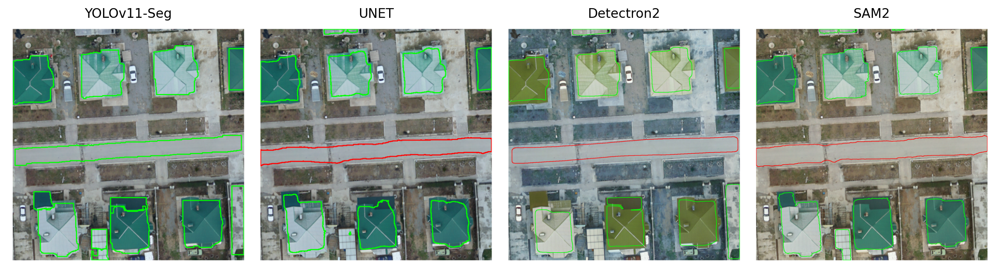

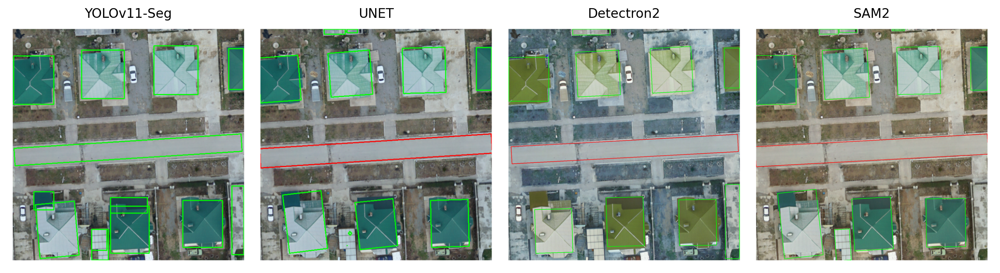

In [21]:
plot_saved_comparisons_uniform(
    polygons_files=[PROJECT_DIR+"/polygon_YOLO.png",PROJECT_DIR+"/polygon_UNET.png",PROJECT_DIR+"/polygon_detectron2.png",PROJECT_DIR+"/polygon_SAM2.png"],
    rotated_files =[PROJECT_DIR+"/rotated_YOLO.png",PROJECT_DIR+"/rotated_UNET.png",PROJECT_DIR+"/rotated_detectron2.png",PROJECT_DIR+"/rotated_SAM2.png"],
    titles=("YOLOv11-Seg","UNET","Detectron2","SAM2"),
    target_hw=(640, 640),                 # pick any panel size you like
    save_out_polygons_row="row_polygons_uniform.png",
    save_out_rotated_row="row_rotated_uniform.png",
    dpi=200
)
